In [3]:
import numpy as np
import soundfile as sf
import pretty_midi
import matplotlib.pyplot as plt
import librosa
import IPython.display as ipd
import utils as u
import crepe_notes
import pygame

pygame 2.6.1 (SDL 2.28.4, Python 3.10.12)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
def load_choral_singing_data(base_path, piece, section, idx):
    """
    Load the Choral Singing Dataset for a specific piece, section, and singer index.

    Parameters:
        base_path (str): The base path to the dataset directory.
        piece (str): The piece identifier ('LI', 'ER', 'ND').
        section (str): The choir section ('soprano', 'alto', 'tenor', 'bass').
        idx (int): The singer index (1 to 4).

    Returns:
        tuple: A tuple containing audio data, sample rate, F0 annotations, note annotations, and MIDI data.
    """
    # Construct the file paths
    audio_file = f"{base_path}/CSD_{piece}_{section}_{idx}.wav"
    f0_file = f"{base_path}/CSD_{piece}_{section}_{idx}.f0"
    notes_file = f"{base_path}/CSD_{piece}_{section}_notes.lab"
    midi_file = f"{base_path}/CSD_{piece}_{section}_midi.mid"

    # Load audio
    audio, sr = sf.read(audio_file)

    # Load F0 annotations
    f0 = np.loadtxt(f0_file)

    # Load note annotations
    notes = np.loadtxt(notes_file)

    # Load MIDI data
    midi = pretty_midi.PrettyMIDI(midi_file)

    return audio, sr, f0, notes, midi

In [7]:
audio, sr, f0, notes, the_midi = load_choral_singing_data("ChoralSingingDataset", "ER", "alto", "1")

In [8]:
print(audio)
print(sr)
print(f0.shape)
print(notes.shape)
print(the_midi)

[0.00035554 0.00052607 0.00053471 ... 0.00204796 0.00188285 0.00209397]
44100
(23320, 2)
(114, 3)


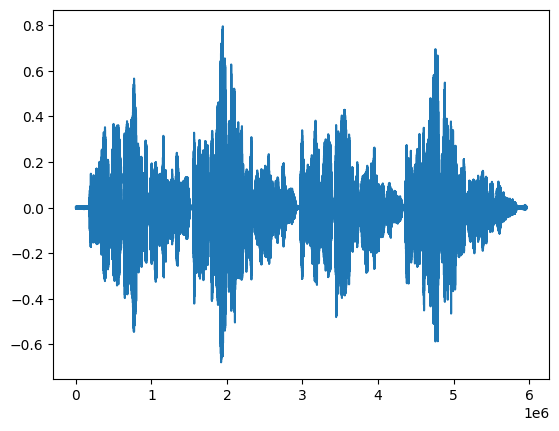

In [9]:
plt.plot(audio)
ipd.Audio(audio, rate=sr)

In [10]:
from matplotlib import colormaps

/var/folders/ch/cwjm9sld5l9c5qvjslgsyzgr0000gn/T/ipykernel_4077/1375030613.py:3: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],


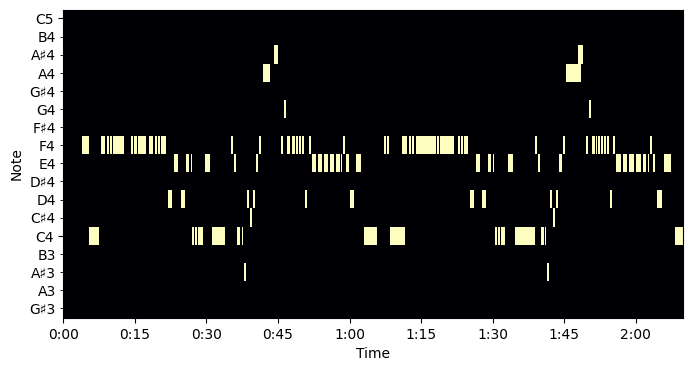

In [11]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(8, 4))
plot_piano_roll(the_midi, 56, 73)

In [12]:
time, frequency, confidence, activation = u.estimate_pitch(audio, sr)

2024-12-03 16:10:50.048554: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-12-03 16:10:50.048596: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2024-12-03 16:10:50.048623: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2024-12-03 16:10:50.048693: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-03 16:10:50.048709: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-12-03 16:10:57.926482: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


424/424 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step


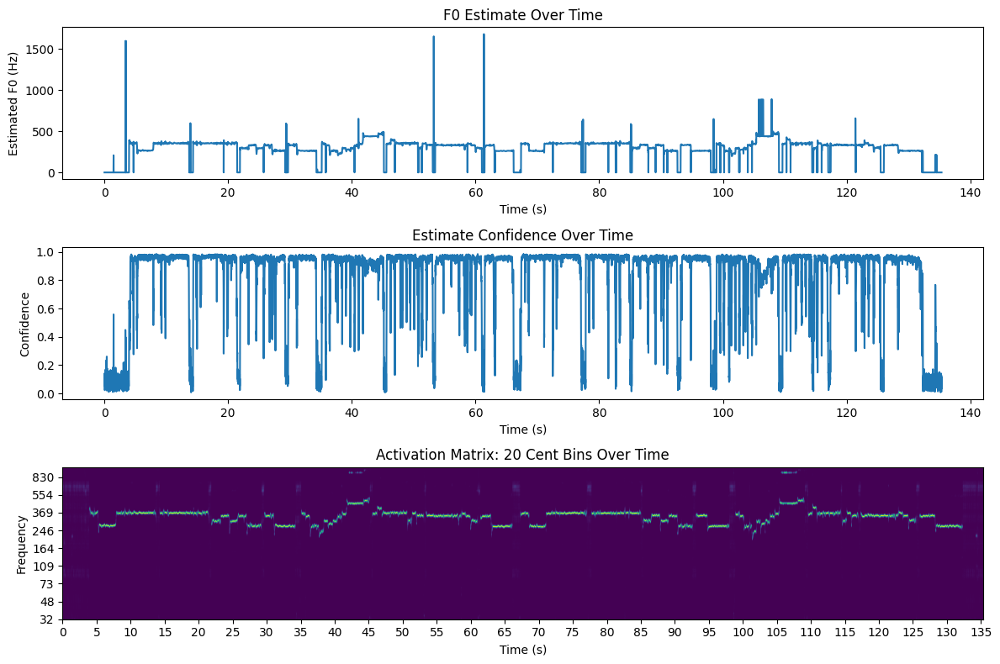

In [13]:
u.plot_pitch(time, frequency, confidence, activation)

In [14]:
!crepe_notes --help


Usage: crepe_notes [OPTIONS] AUDIO_PATH

Options:
  --output-label TEXT
  --sensitivity FLOAT RANGE     [0<=x<=1]
  --min-duration FLOAT RANGE    Minimum duration of a note in seconds
                                [0<=x<=1]
  --min-velocity INTEGER RANGE  Minimum velocity of a note in midi scale
                                (0-127)  [0<=x<=127]
  --disable-splitting           Disable detection of repeated notes via onset
                                detection
  --tuning-offset FLOAT RANGE   Manually apply a tuning offset in cents.
                                Fractional numbers are allowed. Set to 0 for
                                no offset, otherwise it will be calculated
                                automatically.  [-100<=x<=100]
  --use-smoothing               Enable smoothing of confidence
  --use-cwd                     If True, write to the cwd of the current
                                command, else write to the parent folder of
                            

In [15]:
!crepe_notes --sensitivity 0.05 --min-duration 0.1 ChoralSingingDataset/CSD_ER_alto_1.wav

2024-12-03 16:11:42.516262: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-12-03 16:11:42.516305: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 18.00 GB
2024-12-03 16:11:42.516315: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 6.00 GB
2024-12-03 16:11:42.516339: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-03 16:11:42.516358: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-12-03 16:11:46.589644: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
424/424 ━━━━━━━━━━━━━━━━━━━

In [38]:
from music21 import *

# Set the path for MuseScore
us = environment.UserSettings()
us['musescoreDirectPNGPath'] = '/Applications/MuseScore 4.app/Contents/MacOS/mscore'

# Parse the MIDI file
score = converter.parse('ChoralSingingDataset/CSD_ER_alto_1.transcription.mid')

# Write the score to MusicXML format
score.write('musicxml', 'CSD_ER_alto_1.transcription.xml')

PosixPath('/Volumes/ADATA/NYUF24/MIRR/mir_final_gh copy/CSD_ER_alto_1.transcription.xml')

In [66]:
from music21 import * 

In [67]:
configure.run()


______________________________________________________________________________ 
  
Welcome to the music21 Configuration Assistant. You will be guided through a 
number of questions to install and set up music21. Simply pressing return at a 
prompt will select a default, if available. 

You may run this configuration again at a later time by running 
music21/configure.py. 
  
______________________________________________________________________________ 
  
Defining an XML Reader permits automatically opening music21-generated 
MusicXML in an editor for display and manipulation when calling the show() 
method. Setting this option is highly recommended. 
  
[1] /Applications/MuseScore 4.app 
  
Choose a number from the preceding options (default is 1): 
MusicXML Reader set to: /Applications/MuseScore 4.app 
  
______________________________________________________________________________ 
  
The BSD-licensed music21 software is distributed with a corpus of encoded 
compositions which ar

In [39]:
score_xml = converter.parse('CSD_ER_alto_1.transcription.xml', format ='xml')
score_xml.show('xml')

/Volumes/ADATA/NYUF24/MIRR/mir_final_gh copy/.venv/lib/python3.10/site-packages/music21/musicxml/xmlToM21.py:4786: MusicXMLWarning: Cannot put in an element with a missing voice tag when no previous voice tag was given.  Assuming voice 1... 
  warnings.warn('Cannot put in an element with a missing voice tag when '


In [16]:
random_midi = pretty_midi.PrettyMIDI('ChoralSingingDataset/CSD_ER_alto_1.transcription.mid')

In [17]:
random_midi.instruments[0].notes

for note in random_midi.instruments[0].notes:
    # Set the velocity of the note to 0
    note.velocity = 99
    print(note)



Note(start=4.159091, end=4.559091, pitch=65, velocity=99)
Note(start=4.559091, end=4.729545, pitch=65, velocity=99)
Note(start=4.729545, end=5.270455, pitch=65, velocity=99)
Note(start=5.290909, end=7.900000, pitch=60, velocity=99)
Note(start=7.920455, end=9.159091, pitch=65, velocity=99)
Note(start=9.220455, end=9.800000, pitch=65, velocity=99)
Note(start=9.879545, end=10.540909, pitch=65, velocity=99)
Note(start=10.540909, end=13.779545, pitch=65, velocity=99)
Note(start=14.329545, end=14.829545, pitch=65, velocity=99)
Note(start=14.920455, end=15.650000, pitch=65, velocity=99)
Note(start=15.650000, end=18.179545, pitch=65, velocity=99)
Note(start=18.179545, end=19.259091, pitch=65, velocity=99)
Note(start=19.259091, end=19.850000, pitch=65, velocity=99)
Note(start=19.979545, end=20.590909, pitch=65, velocity=99)
Note(start=20.590909, end=21.379545, pitch=65, velocity=99)
Note(start=21.920455, end=22.059091, pitch=62, velocity=99)
Note(start=22.059091, end=23.300000, pitch=62, veloci

/var/folders/ch/cwjm9sld5l9c5qvjslgsyzgr0000gn/T/ipykernel_65475/4282205536.py:3: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],


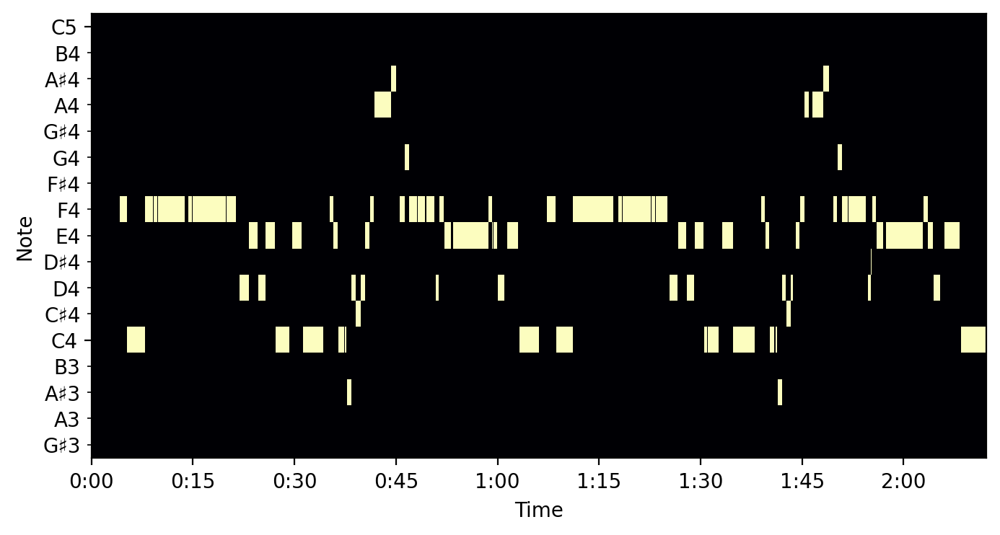

In [43]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))

plt.figure(figsize=(8, 4))
plot_piano_roll(random_midi, 56, 73)

In [45]:
score_xml = converter.parse('ChoralSingingDataset/CSD_ER_alto_1.transcription.mid', format ='midi')
score_xml.show('xml')

In [20]:
tempo_estimate = random_midi.estimate_tempo()
print(tempo)


92.3480542195012


/var/folders/ch/cwjm9sld5l9c5qvjslgsyzgr0000gn/T/ipykernel_4077/1375030613.py:3: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],


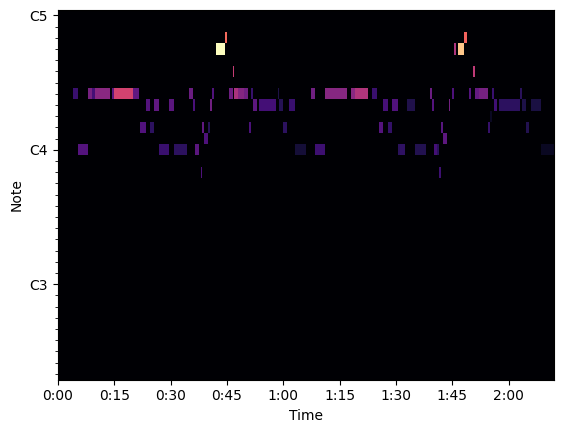

In [59]:
import mido
from mido import MidiFile, MidiTrack, Message

target_tempo = 120
beat_duration = 60 / target_tempo
estimated_midi = random_midi


# Get current note onsets
for instrument in estimated_midi.instruments:
    for note in instrument.notes:
        # Find the nearest beat
        quantized_start = round(note.start / beat_duration) * beat_duration
        note.start = quantized_start

        # Quantize end time and ensure it's valid
        quantized_end = round(note.end / beat_duration) * beat_duration
        if quantized_end < quantized_start:
            quantized_end = quantized_start + 0.1  # Set a minimum duration of 0.1 seconds
        note.end = quantized_end
estimated_midi.write('quantized_example.mid')

plot_piano_roll(estimated_midi, 40, 73)



In [45]:
audio_data = estimated_midi.synthesize()
sf.write('sonified_output.wav', audio_data, 44100)
data, fs = sf.read('sonified_output.wav', dtype='float32')

